In [45]:
# LC 专项统一配置：切换方案时不再复制整份 Notebook
LC_CASE_KEY = "base_1p1_non_pcs"  # base_1p1_non_pcs / two_1_non_pcs / safety
LC_CASES = {
    "base_1p1_non_pcs": {
        "label": "1+1非PCS", "data_prefix": "1+1非PCS",
        "negative_thickness_m": 6.436e-05, "positive_thickness_m": 8.435e-05,
        "positive_radius_m": 5.045e-7, "electrode_height_m": 14.590 * 2,
        "cmax_positive": 20237, "positive_porosity": 0.2815, "positive_active_fraction": 0.7238,
        "negative_porosity": 0.3224, "negative_active_fraction": 0.6882,
        "separator_porosity": 0.38, "normalization_capacity_ah": 330.0,
    },
    "two_1_non_pcs": {
        "label": "2+1非PCS", "data_prefix": "2+1非PCS",
        "negative_thickness_m": 6.478e-05, "positive_thickness_m": 8.4e-05,
        "positive_radius_m": 4.6e-7, "electrode_height_m": 14.857 * 2,
        "cmax_positive": 20471, "positive_porosity": 0.2873, "positive_active_fraction": 0.7182,
        "negative_porosity": 0.3224, "negative_active_fraction": 0.6882,
        "separator_porosity": 0.41, "normalization_capacity_ah": 330.0,
    },
    "safety": {
        "label": "安全方案", "data_prefix": "安全方案",
        "negative_thickness_m": 6.595e-05, "positive_thickness_m": 8.211e-05,
        "positive_radius_m": 4.25e-7, "electrode_height_m": 14.911 * 2,
        "cmax_positive": 20315, "positive_porosity": 0.2864, "positive_active_fraction": 0.7210,
        "negative_porosity": 0.3494, "negative_active_fraction": 0.6583,
        "separator_porosity": 0.38, "normalization_capacity_ah": 328.0,
    },
}
if LC_CASE_KEY not in LC_CASES:
    raise ValueError(f"未知 LC 方案: {LC_CASE_KEY}")
LC_CASE = LC_CASES[LC_CASE_KEY]
print("LC case:", LC_CASE["label"])

%load_ext autoreload
%autoreload 2
import pybamm
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import sys
sys.path.append(r'D:\Users\hez\Desktop\hithium\工具\BatteryModelPack_v1.5')
from batterymodel.dataio import *
from batterymodel.utils.plot import *

sigma = pd.read_csv(r'..\params\E_sigma.csv', header=None)
Ds = pd.read_csv(r'..\params\E_DL_int1.csv', header=None)
transNum = pd.read_csv(r'..\params\E_transpNm.csv', header=None)
LFP = pd.read_csv(r'..\params\LFP.csv', header=None)
Gr_charge = pd.read_csv(r'..\params\Gr_charge.csv', header=None)
Gr_discharge = pd.read_csv(r'..\params\Gr_discharge.csv', header=None)

LFP_func = interp1d(LFP[0], LFP[1], fill_value='extrapolate')
Gr_charge_func = interp1d(Gr_charge[0], Gr_charge[1], fill_value='extrapolate')
Gr_discharge_func = interp1d(Gr_discharge[0], Gr_discharge[1], fill_value='extrapolate')

# soc = np.linspace(0, 1, 500)
soc = np.linspace(0, 1, 500)
LFP = LFP_func(soc)
Gr_charge = Gr_charge_func(soc)
Gr_discharge = Gr_discharge_func(soc)

F = 96485.33212
Ds_x = Ds[0].to_numpy()
Ds_y = Ds[1].to_numpy()
sigma_x = sigma[0].to_numpy()
sigma_y = sigma[1].to_numpy()
transNum_x = transNum[0].to_numpy()
transNum_y = transNum[1].to_numpy()

def electrolyte_diffusivity_Nyman2008_arrhenius(c_e, T):
    p = [5.55347004e-20, -2.75740663e-16, 2.48896764e-13, 3.50298875e-10]
    D_c_e = p[0] * 1000 ** 3 + p[1] * 1000 ** 2 + p[2] * 1000 + p[3]
    # D_c_e = 8.794e-11 * (c_e / 1000) ** 2 - 3.972e-10 * (c_e / 1000) + 4.862e-10

    # E_D_c_e = 17000
    E_D_c_e = 0
    arrhenius = np.exp(E_D_c_e / pybamm.constants.R * (1 / 298.15 - 1 / T))

    return D_c_e * arrhenius


def electrolyte_conductivity(c_e, T):
    sigma_e = (
            0.1297 * (c_e / 1000) ** 3 - 2.51 * (c_e / 1000) ** 1.5 + 3.329 * (c_e / 1000)
    )

    # E_sigma_e = 17000
    E_sigma_e = 0
    arrhenius = np.exp(E_sigma_e / pybamm.constants.R * (1 / 298.15 - 1 / T))

    return sigma_e * arrhenius


# 充放电的OCP曲线有差异
def LFP_ocp_Hithium280Ah(sto):
    return pybamm.Interpolant(soc, LFP + 0.02, sto, name='Pos_OCP', interpolator='cubic')


def graphite_ocp_Hithium280Ah(sto):
    return pybamm.Interpolant(soc, Gr_charge-0.01, sto, name='Neg_OCP', interpolator='cubic')


def plating_exchange_current_density_OKane2020(c_e, c_Li, T):
    E_plating = 11178
    arrhenius = np.exp(E_plating / pybamm.constants.R * (1 / 298.15 - 1 / T))
    k_plating = pybamm.Parameter("Lithium plating kinetic rate constant [m.s-1]")

    return k_plating * arrhenius


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [46]:
def get_hithium_params(t_factor=1,temperature=298.15):
    def LFP_diffusivity(sto, T):
        D_ref = 2.4e-16
        if temperature < 298:
            E_D_s = 45000
        else:
            E_D_s = 20000
        # D_revise = pybamm.Interpolant(D_LFP_func_x, D_LFP_func_y, sto, interpolator="linear", extrapolate=False) # 用插值会出现bug
        arrhenius = np.exp(E_D_s / pybamm.constants.R * (1 / 298.15 - 1 / T))
        D_revise = 1
        return D_revise * D_ref * arrhenius

    def Gr_diffusivity(sto, T):
        D_ref = 1.06e-14
        if temperature < 298:
            E_D_s = 50000
        else:
            E_D_s = 20000
        # D_revise = pybamm.Interpolant(D_Gr_func_x, D_Gr_func_y, sto, name='D_neg', interpolator="linear")
        D_revise = 1
        # D_revise = D_ref
        # E_D_s not given by Chen et al (2020), so taken from Ecker et al. (2015) instead
        arrhenius = np.exp(E_D_s / pybamm.constants.R * (1 / 298.15 - 1 / T))
        # arrhenius = 1
        return D_revise * D_ref * arrhenius

    def graphite_exchange_current_density(c_e, c_s_surf, c_s_max, T):
        # sto = c_s_surf / c_s_max
        c_l_ref = 1e3
        m_ref = 1.2121e-9  # (A/m2)(m3/mol)**1.5 - includes ref concentrations
        if temperature < 298:
            E_r = 60000
        else:
            E_r = 20000
        # E_r = 0
        arrhenius = np.exp(E_r / pybamm.constants.R * (1 / 298.15 - 1 / T))
        # arrhenius = 1
        # K_revise = pybamm.Interpolant(K_Gr_func_x, K_Gr_func_y, sto, name='Neg_i0', interpolator="linear")
        K_revise = 1
        return m_ref * arrhenius * (c_e / c_l_ref) ** 0.5 * c_s_surf ** 0.5 * (c_s_max - c_s_surf) ** 0.5 * K_revise * F

    def LFP_exchange_current_density(c_e, c_s_surf, c_s_max, T):
        # sto = c_s_surf / c_s_max
        c_l_ref = 1e3
        m_ref = 1.1131e-10  # (A/m2)(m3/mol)**1.5 - includes ref concentrations
        if temperature < 298:
            E_r = 35000
        else:
            E_r = 20000
        # E_r = 0
        arrhenius = np.exp(E_r / pybamm.constants.R * (1 / 298.15 - 1 / T))
        # arrhenius = 1
        # K_revise = pybamm.Interpolant(K_LFP_func_x, K_LFP_func_y, sto, name='Pos_i0', interpolator="linear")
        K_revise = 1
        return m_ref * arrhenius * (c_e / c_l_ref) ** 0.5 * c_s_surf ** 0.5 * (c_s_max - c_s_surf) ** 0.5 * K_revise * F

    def cracking_rate_Ai2020(T):
        k_cr = 0.3*2.1939307272313407e-21* t_factor  # Paris’ law cracking rate
        Eac_cr = 10000  # to be implemented
        arrhenius = np.exp(Eac_cr / pybamm.constants.R * (1 / 298.15 - 1 / T ))
        return k_cr * arrhenius
    

    def LAM_rate(T=temperature):
        # sto = c_s_surf / c_s_max
        k_lam_neg = 1.0882895732868533e-7* t_factor
        E_r = 60000 
        arrhenius = np.exp(E_r / pybamm.constants.R * (1 / 298.15 - 1 / T))
        return k_lam_neg * arrhenius

    if temperature < 298.15:
        k_sei = 0.001
        D_sei = 5
    else:
        k_sei = .005
        D_sei = 3
        
    hithium_params = {
        # cell
        "Negative electrode thickness [m]": LC_CASE["negative_thickness_m"],
        "Separator thickness [m]": 1.1e-05,
        "Positive electrode thickness [m]": LC_CASE["positive_thickness_m"],
        "Negative particle radius [m]": 5.55e-6,
        "Positive particle radius [m]": LC_CASE["positive_radius_m"],
        "Electrode height [m]": LC_CASE["electrode_height_m"],
        "Electrode width [m]": 0.1875,
        "Nominal cell capacity [A.h]": 314,
        "Number of electrodes connected in parallel to make a cell": 2.0,
        "Maximum concentration in negative electrode [mol.m-3]": 29094,
        "Maximum concentration in positive electrode [mol.m-3]": LC_CASE["cmax_positive"],
        "Positive electrode porosity": LC_CASE["positive_porosity"],
        "Positive electrode active material volume fraction": LC_CASE["positive_active_fraction"],
        "Negative electrode porosity": LC_CASE["negative_porosity"],
        "Negative electrode active material volume fraction": LC_CASE["negative_active_fraction"],
        'Separator porosity': LC_CASE["separator_porosity"],
        "Initial concentration in negative electrode [mol.m-3]": 396.87,
        "Initial concentration in positive electrode [mol.m-3]": 19000,
        "Lower voltage cut-off [V]": 2.5,
        "Upper voltage cut-off [V]": 3.65,
        "Open-circuit voltage at 0% SOC [V]": 2.5,
        "Open-circuit voltage at 100% SOC [V]": 3.65,
        "Negative electrode exchange-current density [A.m-2]"
        "": graphite_exchange_current_density,
        "Positive electrode exchange-current density [A.m-2]"
        "": LFP_exchange_current_density,
        'Electrolyte diffusivity [m2.s-1]': electrolyte_diffusivity_Nyman2008_arrhenius,
        "Electrolyte conductivity [S.m-1]": electrolyte_conductivity,
        "Positive electrode diffusivity [m2.s-1]": LFP_diffusivity,
        "Negative electrode diffusivity [m2.s-1]": Gr_diffusivity,
        "Positive electrode Bruggeman coefficient (electrode)": 1.5,
        "Positive electrode Bruggeman coefficient (electrolyte)": 1.5,
        "Negative electrode Bruggeman coefficient (electrolyte)": 1.5,
        "Negative electrode Bruggeman coefficient (electrode)": 1.5,
        "Positive electrode conductivity [S.m-1]": 91.3,
        "Negative electrode conductivity [S.m-1]": 100,
        "Initial concentration in electrolyte [mol.m-3]": 900.0,
        "Negative electrode OCP [V]": graphite_ocp_Hithium280Ah,
        "Positive electrode OCP [V]": LFP_ocp_Hithium280Ah,
        # 'Cation transference number': transfer_num,
        'Contact resistance [Ohm]': 1.002e-4,
        'Positive electrode double-layer capacity [F.m-2]': 0,
        'Negative electrode double-layer capacity [F.m-2]': 0,
        # 老化参数定义，其他都是OKane的参数
        "Lithium plating transfer coefficient": 0.5,
        "Exchange-current density for plating [A.m-2]": plating_exchange_current_density_OKane2020,
        "Outer SEI partial molar volume [m3.mol-1]": 0.00009645,
        "Initial inner SEI thickness [m]": 5e-9,
        "Negative electrode LAM constant proportional term [s-1]": 0.5*1.0882895732868533e-7 * t_factor,
        "SEI kinetic rate constant [m.s-1]": 4.809982610110174e-14 *k_sei* t_factor,
        "EC diffusivity [m2.s-1]": 3.487219488169518e-22 *D_sei* t_factor,
        "Negative electrode cracking rate": cracking_rate_Ai2020 ,
        "Lithium plating kinetic rate constant [m.s-1]": 0.00003181158194366325*1 ,
        "SEI growth activation energy [J.mol-1]": 49887.19876117447*.7,
        "Exchange-current density for stripping [A.m-2]": 1e-3,
        "Exchange-current density for plating [A.m-2]": 1.5e-3,
        "Ratio of lithium moles to SEI moles": 1.5
    }
    return hithium_params

In [47]:
model = pybamm.lithium_ion.DFN({
    "SEI": "ec reaction limited",
    "SEI porosity change": "true",
    "lithium plating": "irreversible",
    "lithium plating porosity change": "true",
    "particle mechanics": ("swelling and cracking", "swelling only"),
    "SEI on cracks": "true",
    "loss of active material": "stress-driven",
    "calculate discharge energy": "true",
    "contact resistance": "true"
})
var_pts = {"x_n": 5, "x_s": 5, "x_p": 5,"r_n": 25, "r_p": 20}
solver = pybamm.IDAKLUSolver()

# 循环老化实验
rate_range = [0.5,0.5]
temperature_range = [288.15, 298.15]  # 温度范围
sol_list = []
result_dict = {}
for rate,temperature in zip(rate_range, temperature_range):
    print(f"\nRunning simulation for rate: {rate} at temperature: {temperature} K")
    exp = pybamm.Experiment(
        [
            ("Charge at %dW until 3.65 V (%.1f minute period)" % (rate* 314 * 3.2, 0.5),
             "Rest for %d minute (0.5 minute period)" % (10),
             "Discharge at %dW until 2.5 V (%.1f minute period)" % (rate*314 * 3.2, 0.5),
             "Rest for %d minute (0.5 minute period)" % (10))] * 1,temperature=temperature)  # 共跑1个循环
    params = pybamm.ParameterValues('OKane2022')
    params.update(get_hithium_params(1,temperature), check_already_exists=False)  # 先把最开始的循环跑了，用于消除初始soc带来的容量差异
    sim = pybamm.Simulation(model, parameter_values=params, experiment=exp, var_pts=var_pts, solver=solver)
    sol = sim.solve(showprogress=True)
    exp = pybamm.Experiment(
        [
            ("Charge at %dW until 3.65 V (%.1f minute period)" % (rate* 314 * 3.2, 0.5),
             "Rest for %d minute (0.5 minute period)" % (10),
             "Discharge at %dW until 2.5 V (%.1f minute period)" % (rate* 314 * 3.2, 0.5),
             "Rest for %d minute (0.5 minute period)" % (10))] *100,temperature=temperature)  # 共跑40个循环
    params.update(get_hithium_params(50,temperature), check_already_exists=False)  # 加速因子1圈抵50圈
    sim = pybamm.Simulation(model, parameter_values=params, experiment=exp, var_pts=var_pts,solver=solver)
    sol = sim.solve(showprogress=True, starting_solution=sol)
    result_dict[rate] = get_discharge_capacity(sol)['discharge_capacity']
    sol_list.append(sol)


Running simulation for rate: 0.5 at temperature: 288.15 K


Cycling:  49%|████▉     | 49/100 [00:27<00:25,  2.02it/s]2025-06-28 10:16:00.058 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-06-28 10:16:00.060 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-06-28 10:16:00.060 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-06-28 10:16:00.060 - [ERROR] solution.check_ys_are_not_t


Running simulation for rate: 0.5 at temperature: 298.15 K


Cycling:  49%|████▉     | 49/100 [00:28<00:28,  1.79it/s]2025-06-28 10:17:04.094 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-06-28 10:17:04.094 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-06-28 10:17:04.108 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-06-28 10:17:04.109 - [ERROR] solution.check_ys_are_not_t

# 不同SOC DCR&Power

In [144]:
#dcr和功率测试
#初始化模型及参数
model = pybamm.lithium_ion.DFN({
    "SEI": "ec reaction limited",
    "SEI porosity change": "true",
    "lithium plating": "irreversible",
    "lithium plating porosity change": "true",
    "particle mechanics": ("swelling and cracking", "swelling only"),
    "SEI on cracks": "true",
    "loss of active material": "stress-driven",
    "calculate discharge energy": "true",
    "contact resistance": "true"
})
solver = pybamm.IDAKLUSolver()
var_pts = {"x_n": 5, "x_s": 5, "x_p": 5,"r_n": 25, "r_p": 25}

# 定义DCR测试函数
def perform_dcr_test(sol, params, current=314, charge_time=None):
    if charge_time is None:  # 默认值处理
        charge_time = 60  # 可设置默认值或抛出错误
    """执行DCR测试并返回DCR值"""
    dcr_exp = pybamm.Experiment([(
        "Charge at 157 A for {} hour (10 second period)".format(charge_time*0.8),        "Rest for 10 minutes (10 second period)",
        "Discharge at {}A for 30 second (0.5 second period)".format(current),
        "Rest for 10 minutes (10 second period)",
        "Charge at {}A for 30 second (0.5 second period)".format(current),
        "Rest for 10 minutes (10 second period)")
    ])

    sim = pybamm.Simulation(
        model, parameter_values=params,
        experiment=dcr_exp, solver=solver, var_pts=var_pts
    )
    test_sol = sim.solve(starting_solution=sol, calc_esoh=False)

    # 计算放电DCR和充电DCR的平均值
    discharge_step = test_sol.cycles[-1].steps[2]
    charge_step = test_sol.cycles[-1].steps[4]
    rest_before_discharge = test_sol.cycles[-2].steps[1]
    rest_before_charge = test_sol.cycles[-1].steps[3]

    dcr_discharge = (rest_before_discharge["Voltage [V]"].entries[-1] -
                    discharge_step["Voltage [V]"].entries[-1]) / current
    dcr_charge = (charge_step["Voltage [V]"].entries[-1] -
                 rest_before_charge["Voltage [V]"].entries[-1]) / current
    power_discharge =((discharge_step["Voltage [V]"].entries[18] + discharge_step["Voltage [V]"].entries[19]+
                    discharge_step["Voltage [V]"].entries[20]) / 3)*current
    power_charge = ((charge_step["Voltage [V]"].entries[18] + charge_step["Voltage [V]"].entries[19]+
                 charge_step["Voltage [V]"].entries[20]) /3) *current
    return (dcr_discharge + dcr_charge) / 2, dcr_discharge, dcr_charge,power_discharge, power_charge,  test_sol , charge_time

# 主程序
result_dict = {}
dcr_results = {}
dcr_discharge_results = {}
dcr_charge_results = {}
power_results = {}
power_discharge_results = {}
power_charge_results = {}
charge_time_results = {} 
temperature = 298.15  # 只运行25°C

# 初始循环消除SOC差异
params = pybamm.ParameterValues("OKane2022")
params.update(get_hithium_params(1, temperature), check_already_exists=False)
sim = pybamm.Simulation(
    model,
    parameter_values=params,
    experiment=pybamm.Experiment([
        ("Charge at 502.4W until 3.65V (0.5 minute period)",
         "Rest for 10 minutes (0.5 minute period)",
         "Discharge at 502.4W until 2.5V (0.5 minute period)",
         "Rest for 10 minutes (0.5 minute period)")] * 1),
    solver=solver,
    var_pts=var_pts
)
sol = sim.solve(showprogress=True)

# 主循环设置
total_cycles = 260 # 总循环次数
cycles_per_block = 20  # 每块循环次数
num_blocks = total_cycles // cycles_per_block

for block in range(num_blocks):
    # 运行加速循环（20次循环，加速因子50等效1000圈）
    params.update(get_hithium_params(50, temperature), check_already_exists=False)
    sim = pybamm.Simulation(
        model,
        parameter_values=params,
        experiment=pybamm.Experiment([
            ("Charge at 502.4W until 3.65V (0.5 minute period)",
             "Rest for 10 minutes (0.5 minute period)",
             "Discharge at 502.4W until 2.5V (0.5 minute period)",
             "Rest for 10 minutes (0.5 minute period)")] * cycles_per_block),
        solver=solver,
        var_pts=var_pts
    )
    sol = sim.solve(starting_solution=sol, showprogress=True, calc_esoh=False)
    # 获取当前放电容量（新增代码）
    discharge_data = get_discharge_capacity(sol)
    if discharge_data['discharge_capacity'].size == 0:
        current_discharge_time = 0  # 处理初始无数据情况
    else:
        current_discharge_time = discharge_data['discharge_capacity'][-1]/157

    # 执行DCR测试
    dcr_value, DCR_discharge, DCR_charge, power_discharge,power_charge,test_sol, charge_time= perform_dcr_test(sol, params,current=314, charge_time=current_discharge_time)
    current_cycle = (block + 1) * cycles_per_block
    dcr_results[current_cycle] = dcr_value
    dcr_discharge_results[current_cycle] = DCR_discharge
    dcr_charge_results[current_cycle] = DCR_charge
    current_cycle = (block + 1) * cycles_per_block
    power_discharge_results[current_cycle] = power_discharge
    power_charge_results[current_cycle] = power_charge
    charge_time_results[current_cycle] = charge_time  # 记录charge_time

    print(f"Cycle {current_cycle*50} DCR: {dcr_value*1000:.2f}mΩ power: {power_charge:.2f}V, {power_discharge:.2f}V, Charge Time: {charge_time:.2f} hour")

Cycling: 100%|██████████| 20/20 [00:12<00:00,  1.59it/s]


Cycle 1000 DCR: 0.53mΩ power: 1091.99V, 1017.60V, Charge Time: 1.95 hour


Cycling: 100%|██████████| 20/20 [00:11<00:00,  1.67it/s]


Cycle 2000 DCR: 0.56mΩ power: 1094.94V, 1014.62V, Charge Time: 1.87 hour


Cycling:  40%|████      | 8/20 [00:05<00:07,  1.70it/s]2025-03-28 17:04:22.334 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:04:22.349 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:04:22.349 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:04:22.349 - [ERROR] solution.check_ys_are_not_too

Cycle 3000 DCR: 0.58mΩ power: 1097.41V, 1012.17V, Charge Time: 1.81 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:04:36.833 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:04:36.833 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:04:36.982 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:04:36.985 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 4000 DCR: 0.60mΩ power: 1099.65V, 1009.97V, Charge Time: 1.75 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:04:55.308 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:04:55.308 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:04:55.479 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:04:55.481 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 5000 DCR: 0.62mΩ power: 1101.78V, 1007.88V, Charge Time: 1.71 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:05:13.713 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:05:13.725 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:05:13.857 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:05:13.857 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 6000 DCR: 0.64mΩ power: 1103.83V, 1005.86V, Charge Time: 1.66 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:05:32.521 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:05:32.537 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:05:32.695 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:05:32.695 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 7000 DCR: 0.66mΩ power: 1105.82V, 1003.88V, Charge Time: 1.62 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:05:50.436 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:05:50.436 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:05:50.590 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:05:50.590 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 8000 DCR: 0.68mΩ power: 1107.80V, 1001.92V, Charge Time: 1.58 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:06:08.917 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:06:08.917 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:06:09.057 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:06:09.060 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 9000 DCR: 0.70mΩ power: 1109.77V, 999.95V, Charge Time: 1.54 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:06:26.883 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:06:26.883 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:06:27.000 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:06:27.000 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 10000 DCR: 0.72mΩ power: 1111.77V, 997.82V, Charge Time: 1.50 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:06:45.065 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[1:2]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:06:45.065 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:06:45.065 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[1:2]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:06:45.065 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 11000 DCR: 0.75mΩ power: 1113.80V, 995.44V, Charge Time: 1.46 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:07:04.130 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[1:2]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:07:04.130 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:07:04.130 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[1:2]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:07:04.130 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 12000 DCR: 0.77mΩ power: 1115.84V, 992.89V, Charge Time: 1.42 hour


Cycling:   0%|          | 0/20 [00:00<?, ?it/s]2025-03-28 17:07:22.412 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[1:2]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:07:22.429 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[3:4]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:07:22.429 - [ERROR] solution.check_ys_are_not_too_large(397): Solution for 'y[1:2]' exceeds the maximum allowed value of `100000.0. This could be due to incorrect scaling, model formulation, or parameter values. The maximum allowed value is set by 'pybammm.settings.max_y_value'.
2025-03-28 17:07:22.429 - [ERROR] solution.check_ys_are_not_too_large(3

Cycle 13000 DCR: 0.80mΩ power: 1117.93V, 990.17V, Charge Time: 1.37 hour


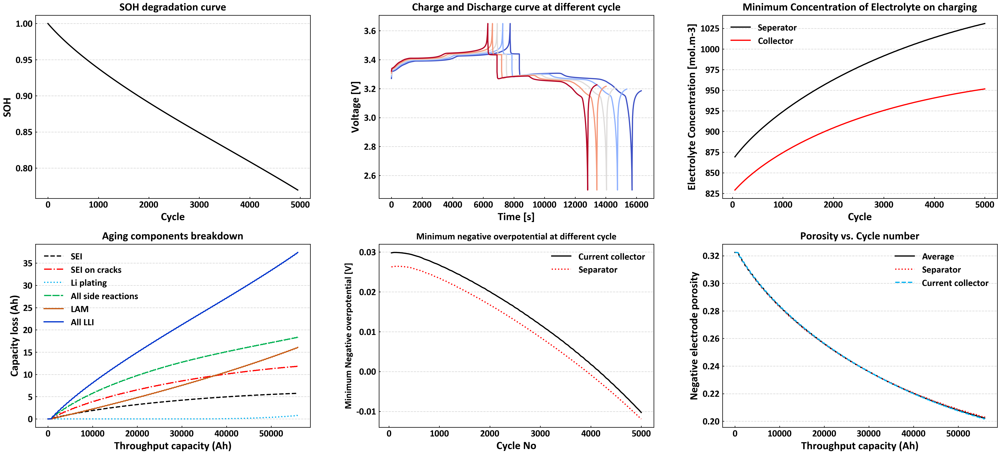

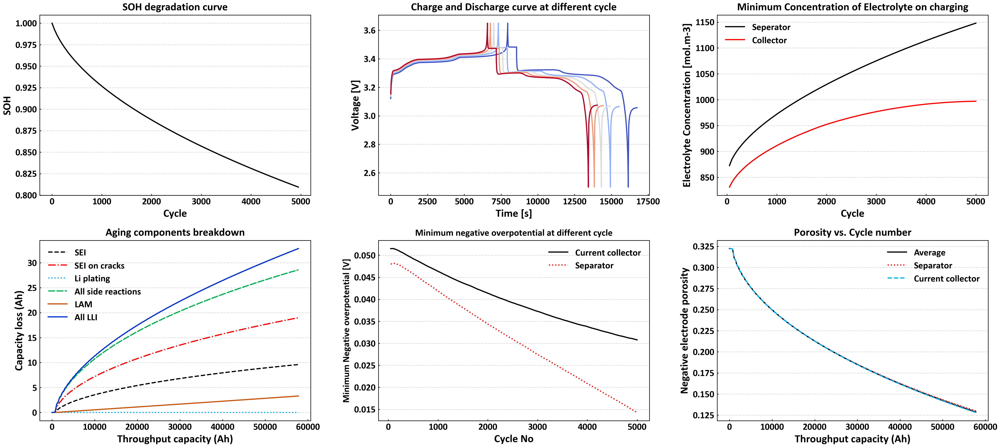

In [49]:
for sol in sol_list:    
    plot_analysis(sol, 50)

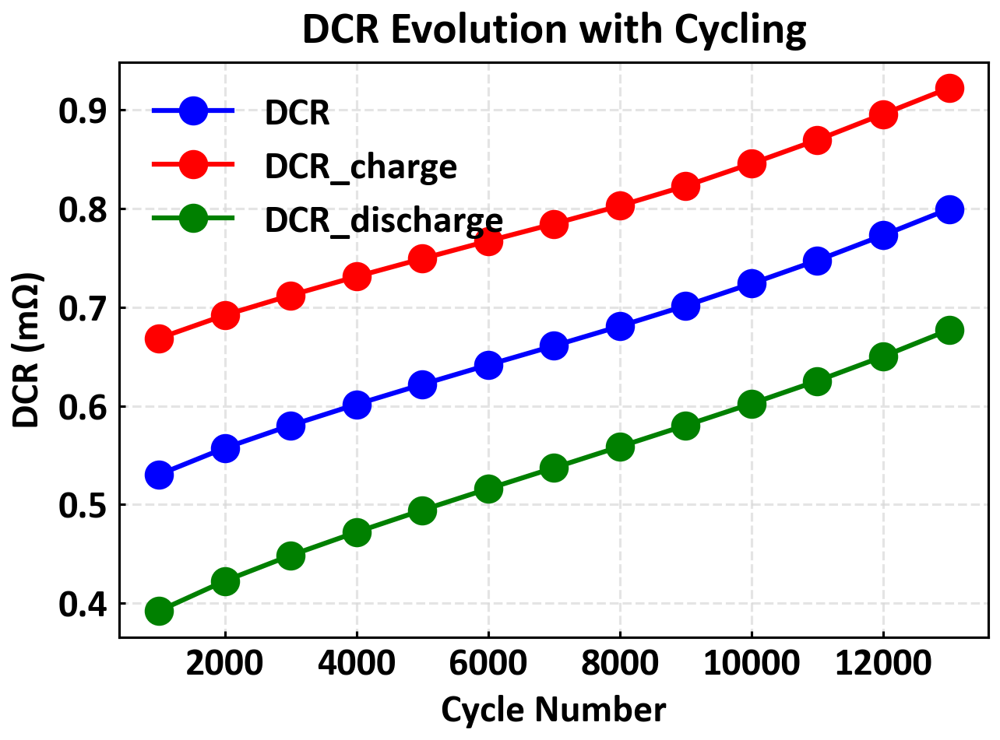

In [134]:
# 绘制结果
#plt.figure(figsize=(10, 6))
cycles = list(dcr_results.keys())
cycles = [c * 50 for c in cycles]
dcr_values = [v*1000 for v in dcr_results.values()]
DCR_discharge=[v*1000 for v in dcr_discharge_results.values()]
DCR_charge=[v*1000 for v in dcr_charge_results.values()]
plt.plot(cycles, dcr_values, 'bo-', markersize=8,label='DCR',color='blue')
plt.plot(cycles, DCR_discharge, 'bo-', markersize=8,label='DCR_charge',color='red')
plt.plot(cycles, DCR_charge, 'bo-', markersize=8,label='DCR_discharge',color='green')
plt.xlabel("Cycle Number", fontsize=12)
plt.ylabel("DCR (mΩ)", fontsize=12)
plt.title("DCR Evolution with Cycling", fontsize=14)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
#plt.xticks(np.arange(0, max(cycles)+1, 20))
plt.show()

# plt.figure(figsize=(10, 6))
# plt.plot(cycles, DCR_discharge, 'bo-', markersize=8)
# plt.xlabel("Cycle Number", fontsize=12)
# plt.ylabel("DCR_discharge (mΩ)", fontsize=12)
# plt.title("Discharge DCR Evolution with Cycling", fontsize=14)
# plt.grid(True, linestyle='--', alpha=0.7)
# plt.show()

# plt.figure(figsize=(10, 6))
# plt.plot(cycles, DCR_charge, 'bo-', markersize=8)
# plt.xlabel("Cycle Number", fontsize=12)
# plt.ylabel("DCR_charge (mΩ)", fontsize=12)
# plt.title("Charge DCR Evolution with Cycling", fontsize=14)
# plt.grid(True, linestyle='--', alpha=0.7)
# plt.show()
# #plt.plot(sol.cycles[-1]['Voltage [V]'].entries, 'bo-', markersize=8)
# import pandas as pd

# # 创建一个DataFrame
# data = pd.DataFrame({
#     'Cycle Number': cycles,
#     'DCR (mΩ)': dcr_values,
#     "DCR_discharge (mΩ)": DCR_discharge,
#     "DCR_charge (mΩ)": DCR_charge
# })

# # 将DataFrame导出到Excel文件
# data.to_excel('dcr_results.xlsx', index=False)

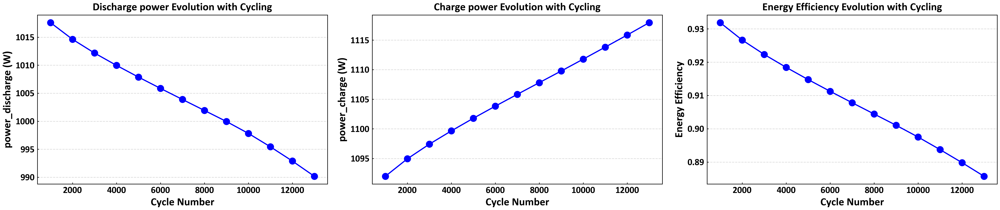

In [145]:
# 绘制结果
cycles = list(power_discharge_results.keys())
cycles = [c * 50 for c in cycles]
# power_values = [v for v in power_results.values()]
power_discharge=[v for v in power_discharge_results.values()]
power_charge=[v for v in power_charge_results.values()]

if len(power_discharge) == len(power_charge):
    energy_efficiency = [discharge / charge for discharge, charge in zip(power_discharge, power_charge) if charge != 0]
else:
    raise ValueError("power_discharge 和 power_charge 列表长度不匹配")

fig, axs = plt.subplots(1, 3, figsize=(18, 4))

axs[0].plot(cycles, power_discharge, 'bo-', markersize=8)
axs[0].set_xlabel("Cycle Number")
axs[0].set_ylabel("power_discharge (W)")
axs[0].set_title("Discharge power Evolution with Cycling")
#axs[0].grid(True, linestyle='--', alpha=0.7)

axs[1].plot(cycles, power_charge, 'bo-', markersize=8)
axs[1].set_xlabel("Cycle Number")
axs[1].set_ylabel("power_charge (W)")
axs[1].set_title("Charge power Evolution with Cycling")
#axs[1].grid(True, linestyle='--', alpha=0.7)

axs[2].plot(cycles, energy_efficiency, 'bo-', markersize=8)
axs[2].set_xlabel("Cycle Number")
axs[2].set_ylabel("Energy Efficiency")
axs[2].set_title("Energy Efficiency Evolution with Cycling")
#axs[2].grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

#plt.plot(sol.cycles[-1]['Voltage [V]'].entries, 'bo-', markersize=8)
import pandas as pd
#创建一个DataFrame
# data = pd.DataFrame({
#     'Cycle Number': cycles,
#     'DCR (mΩ)': dcr_values,
#     "DCR_discharge (mΩ)": DCR_discharge,
#     "DCR_charge (mΩ)": DCR_charge,
#     "power_discharge (W)": power_discharge,
#     "power_charge (W)": power_charge,
#     "energy_efficiency": energy_efficiency
# })

# # 将DataFrame导出到Excel文件
# data.to_excel('80%SOC power&dcr_results1.xlsx', index=False)

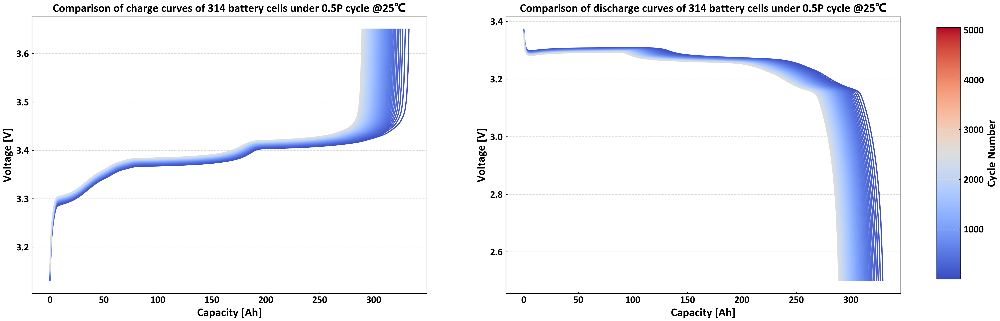

In [5]:
import matplotlib.pyplot as plt

# 获取颜色映射
colors = plt.get_cmap('coolwarm')
plt.rcParams['font.family'] = 'Calibri, Microsoft YaHei'

# 创建2个子图，设置图形大小（稍微留出空间给颜色条）
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 6), gridspec_kw={'width_ratios': [10, 10]})

# 第一个子图：充电电压随循环的变化
for i in range(1, len(sol.cycles)-50, 1):
    t = sol.cycles[i]['Time [s]'].entries
    capacity = sol.cycles[i]['Throughput capacity [A.h]'].entries
    current = sol.cycles[i]['Current [A]'].entries
    t = t[current < 0] - t[current < 0][0]
    capacity = capacity[current < 0] - capacity[current < 0][0]
    voltage = sol.cycles[i]['Voltage [V]'].entries
    ax1.plot(capacity, voltage[current < 0], color=colors(i / len(sol.cycles)))

ax1.set_xlabel("Capacity [Ah]")
ax1.set_ylabel("Voltage [V]")
ax1.set_title("Comparison of charge curves of 314 battery cells under 0.5P cycle @25℃")

# 第二个子图：放电电压随循环的变化
for i in range(1, len(sol.cycles)-50, 1):
    t = sol.cycles[i]['Time [s]'].entries
    capacity = sol.cycles[i]['Throughput capacity [A.h]'].entries
    current = sol.cycles[i]['Current [A]'].entries
    t = t[current > 0] - t[current > 0][0]
    capacity = capacity[current > 0] - capacity[current > 0][0]
    voltage = sol.cycles[i]['Voltage [V]'].entries
    ax2.plot(capacity, voltage[current > 0], color=colors(i / len(sol.cycles)))

ax2.set_xlabel("Capacity [Ah]")
ax2.set_ylabel("Voltage [V]")
ax2.set_title("Comparison of discharge curves of 314 battery cells under 0.5P cycle @25℃")

# 创建和放置颜色条
fig.subplots_adjust(right=0.85)  # 调整子图以给颜色条留出空间
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap=colors, norm=plt.Normalize(vmin=1, vmax=len(sol.cycles)*50))
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.set_label('Cycle Number')

# 展示图形
plt.show()


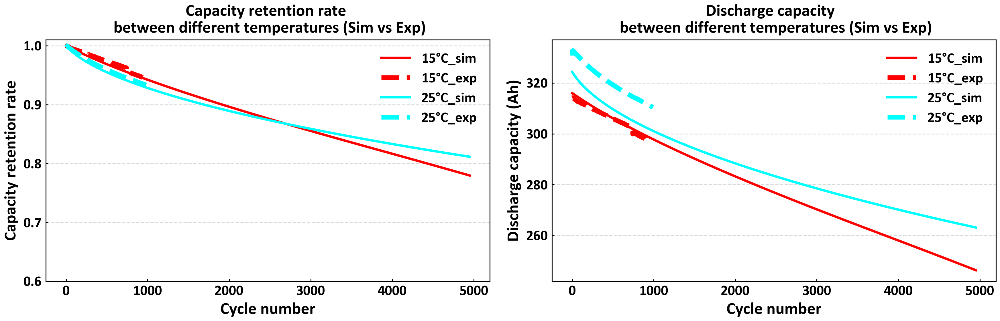

In [38]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('science')

# 假设 max_cycle_id, sol_list, temperature_list 和 exp_data 已经准备好
temperature_list = [15, 25, 35, 45]
max_cycle_id = { 15:1, 25: 9, 35: 1, 45: 2}
exp_data = {}
exp_dch = {}
exp_soh = {}
result = get_discharge_capacity(sol)['discharge_capacity']


# # 加载实验数据并计算 SOH
for temperature in temperature_list:
    exp_data[temperature] = pd.read_csv(Path(r'./data/%d.dat' % temperature))
    exp_dch[temperature] = exp_data[temperature]['放电容量'].to_numpy() 
    exp_soh[temperature] = exp_data[temperature]['放电容量'].to_numpy() / exp_data[temperature]['放电容量'].iloc[max_cycle_id[temperature]]
    exp_soh[temperature] = exp_soh[temperature][max_cycle_id[temperature]:]

color_list = ['red', 'cyan', 'green', 'purple', "blue", "black", "yellow", "orange"]

# 创建 1 行 2 列的子图布局
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

for idx, (sol, temp) in enumerate(zip(sol_list, temperature_list)):
    result = get_discharge_capacity(sol)['discharge_capacity']
    cycle_no = len(result)
    cycle = np.arange(0, 50 * (cycle_no-1), 50)
    ax[0].plot(cycle, result[1:] / result[1], label=f'{temp}°C_sim', color=color_list[idx], linewidth=2)
    ax[0].plot(exp_soh[temp], '--', label=f'{temp}°C_exp', color=color_list[idx], linewidth=4)
    ax[1].plot(cycle, result[1:], label=f'{temp}°C_sim', color=color_list[idx], linewidth=2)
    ax[1].plot(exp_dch[temp], '--', label=f'{temp}°C_exp', color=color_list[idx], linewidth=4)

ax[0].set_xlabel("Cycle number")
ax[0].set_ylabel("Capacity retention rate")
ax[0].set_ylim(0.6, 1.01)
ax[0].legend()
ax[0].set_title("Capacity retention rate \n between different temperatures (Sim vs Exp)")

ax[1].set_xlabel("Cycle number")
ax[1].set_ylabel("Discharge capacity (Ah)")
ax[1].legend()
ax[1].set_title("Discharge capacity  \n between different temperatures (Sim vs Exp)")

# 调整布局使得图不重叠
plt.tight_layout()
# sampled_cycle = cycle[::20]
# sampled_capacity_retention_rate = (result[1:])[::20] / result[1]
# sampled_discharge_capacity = (result[1:])[::20]
# data = pd.DataFrame({
#     'cycle': sampled_cycle,
#     'capacity_retention_rate': sampled_capacity_retention_rate,
#     'discharge_capacity': sampled_discharge_capacity
# })

# # 导出到Excel
# data.to_excel('capacity_retention_rate_sampled.xlsx')

# data = pd.DataFrame({
#     'cycle': cycle,
#     'capacity_retention_rate': (result[1:]) / result[1],
#     'discharge_capacity':result[1:]
# })

# # 导出到Excel
# data.to_excel('capacity_retention_rate.xlsx')

In [10]:
# 获取仿真数据
sim_data = result[1:] / result[1]  # 仿真容量保持率
sim_cycles = cycle  # 仿真循环圈数

# 获取实验数据
exp_data = exp_soh[temperature_list[1]]  # 已经是numpy数组，不需要.values
exp_indices = np.arange(len(exp_data))  # 使用索引作为x轴

# 截取前1000圈数据
max_cycle = 1000
sim_mask = sim_cycles <= max_cycle
exp_mask = exp_indices <= max_cycle

sim_data = sim_data[sim_mask]
exp_data = exp_data[exp_mask]
sim_cycles = sim_cycles[sim_mask]
exp_indices = exp_indices[exp_mask]

from scipy import interpolate

# 创建插值函数
f_sim = interpolate.interp1d(sim_cycles, sim_data, kind='linear', fill_value="extrapolate")
f_exp = interpolate.interp1d(exp_indices, exp_data, kind='linear', fill_value="extrapolate")

# 统一采样点（例如每50个点）
common_points = np.arange(0, max_cycle+1, 50)

# 获取对齐后的数据
sim_aligned = f_sim(common_points)
exp_aligned = f_exp(common_points)

# 计算误差
errors = sim_aligned - exp_aligned

# 计算RMSE
rmse = np.sqrt(np.mean(errors**2))

# 计算RRMSE
rrmse = rmse / np.mean(exp_aligned) * 100  # 以百分比表示

print(f"RMSE: {rmse:.4f}")
print(f"RRMSE: {rrmse:.2f}%")


RMSE: 0.0029
RRMSE: 0.30%


In [12]:
df = pd.read_csv(f'{LC_CASE["data_prefix"]}-15℃ 0.5P三电极数据.csv')
df2 = pd.read_csv(f'{LC_CASE["data_prefix"]}-25℃ 0.5P三电极数据.csv')

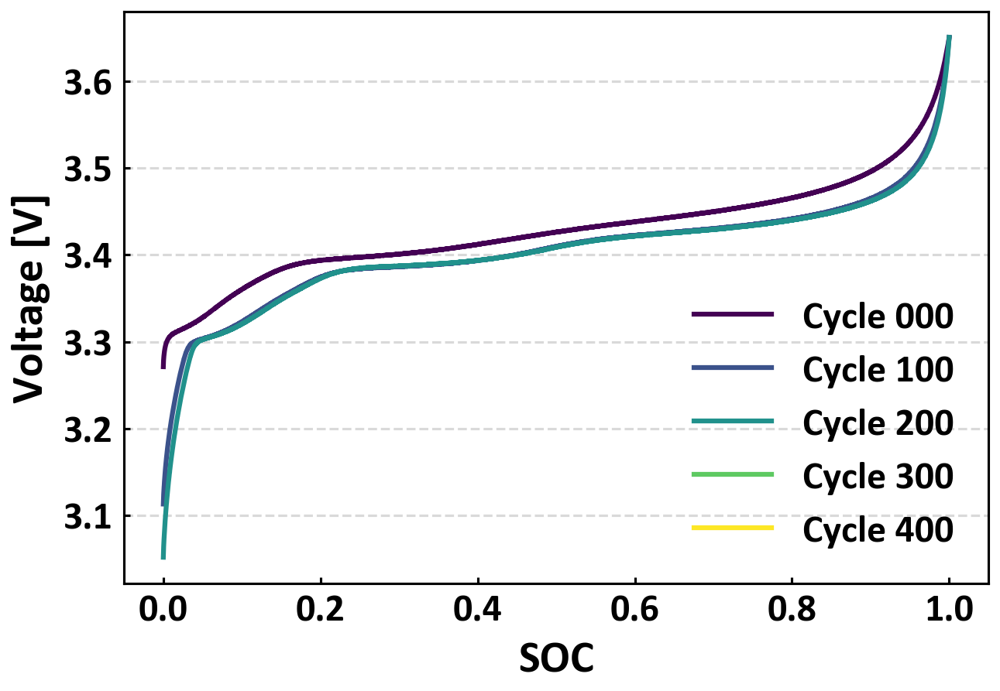

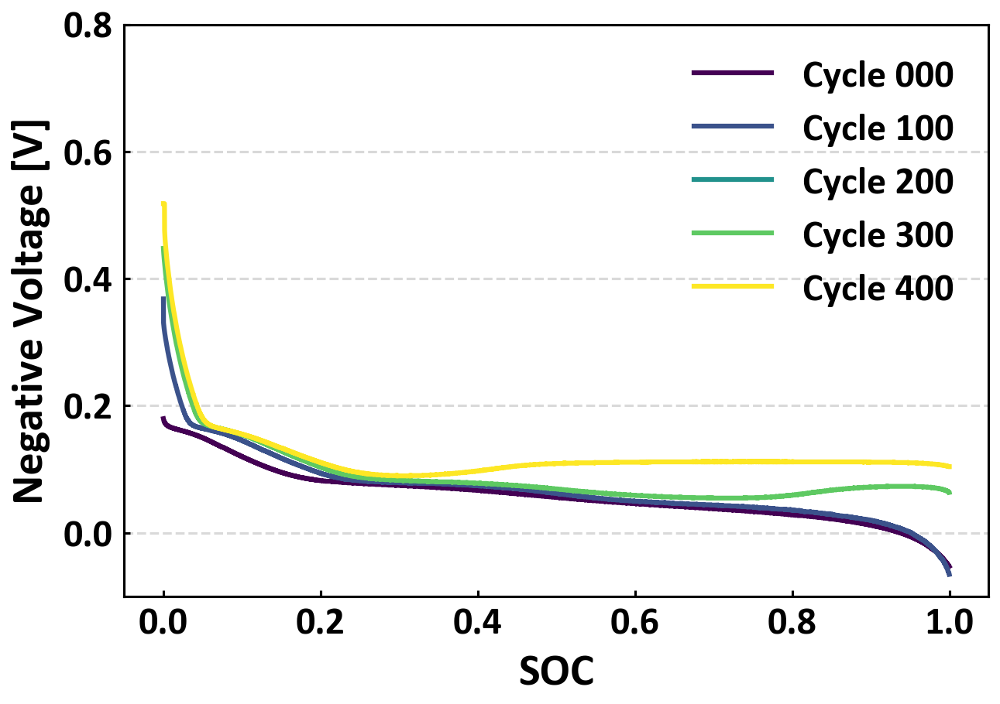

In [24]:
# 使用指定的绘图风格
plt.style.use('science')

# 获取所有以SOC开头的列名（包括SOC, SOC.1, SOC.2等）
soc_columns = [col for col in df.columns if col.startswith("SOC")]

# 第一个图表：SOC列与右侧第二列（即Fresh列）作图
fig1, ax1 = plt.subplots()

# 使用colormap来生成不同的颜色
cmap = plt.get_cmap('viridis')  # 选择viridis颜色映射
num_cycles = len(soc_columns)
colors = cmap(np.linspace(0, 1, num_cycles))  # 生成渐变颜色

for i, soc_col in enumerate(soc_columns):
    voltage_col_index = df.columns.get_loc(soc_col) + 2  # 右侧第二列的索引
    if voltage_col_index < len(df.columns):
        voltage_col = df.columns[voltage_col_index]
        ax1.plot(df[soc_col], df[voltage_col], '-', color=colors[i], label=f'Cycle {i}00')
    else:
        print(f"No Fresh column found to the right of {soc_col}.")

ax1.set_xlabel("SOC")
ax1.set_ylabel("Voltage [V]")
ax1.legend()
plt.show()

# 第二个图表：SOC列与右侧第五列（即负极列）作图
fig2, ax2 = plt.subplots()

# 使用相同的colormap来生成不同的颜色
colors = cmap(np.linspace(0, 1, num_cycles))  # 生成渐变颜色

for i, soc_col in enumerate(soc_columns):
    negetive_col_index = df.columns.get_loc(soc_col) + 5  # 右侧第五列的索引
    if negetive_col_index < len(df.columns):
        negetive_col = df.columns[negetive_col_index]
        ax2.plot(df[soc_col], df[negetive_col], '-', color=colors[i], label=f'Cycle {i}00')
    else:
        print(f"No negative column found to the right of {soc_col}.")

ax2.set_xlabel("SOC")
ax2.set_ylabel("Negative Voltage [V]")
ax2.set_ylim(-0.1, 0.8)  # 设置y轴范围
ax2.legend()
plt.show()


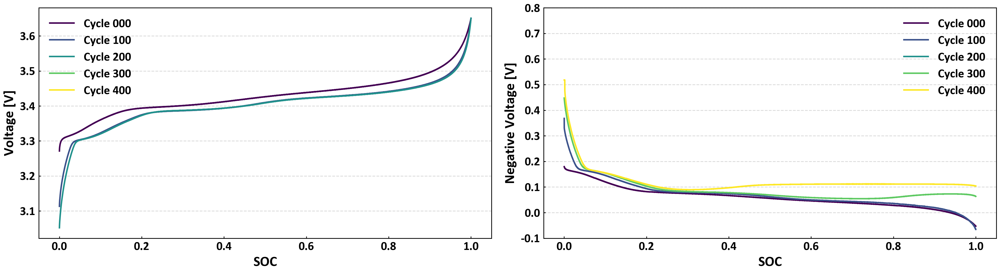

In [10]:
# 使用指定的绘图风格
plt.style.use('science')

# 获取所有以SOC开头的列名（包括SOC, SOC.1, SOC.2等）
soc_columns = [col for col in df.columns if col.startswith("SOC")]

# 创建一个包含两个子图的图形
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))  # 1行2列，调整figsize以适应两张图

# 使用colormap来生成不同的颜色
cmap = plt.get_cmap('viridis')  # 选择viridis颜色映射
num_cycles = len(soc_columns)
colors = cmap(np.linspace(0, 1, num_cycles))  # 生成渐变颜色

# 左图：SOC列与右侧第二列（即Fresh列）作图
for i, soc_col in enumerate(soc_columns):
    voltage_col_index = df.columns.get_loc(soc_col) + 2  # 右侧第二列的索引
    if voltage_col_index < len(df.columns):
        voltage_col = df.columns[voltage_col_index]
        ax1.plot(df[soc_col], df[voltage_col], '-', color=colors[i], label=f'Cycle {i}00')
    else:
        print(f"No Fresh column found to the right of {soc_col}.")

ax1.set_xlabel("SOC")
ax1.set_ylabel("Voltage [V]")
ax1.legend()

# 右图：SOC列与右侧第五列（即负极列）作图
for i, soc_col in enumerate(soc_columns):
    negetive_col_index = df.columns.get_loc(soc_col) + 5  # 右侧第五列的索引
    if negetive_col_index < len(df.columns):
        negetive_col = df.columns[negetive_col_index]
        ax2.plot(df[soc_col], df[negetive_col], '-', color=colors[i], label=f'Cycle {i}00')
    else:
        print(f"No negative column found to the right of {soc_col}.")

ax2.set_xlabel("SOC")
ax2.set_ylabel("Negative Voltage [V]")
ax2.set_ylim(-0.1, 0.8)  # 设置y轴范围
ax2.legend()

plt.tight_layout()  # 自动调整子图参数，使之填充整个图像区域
plt.show()


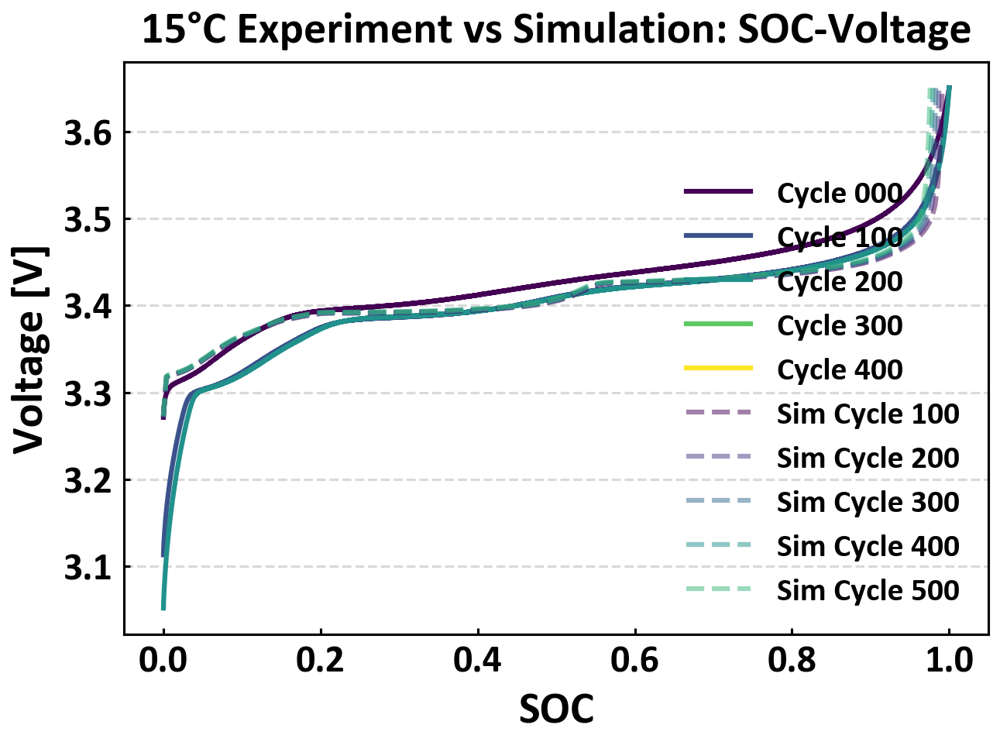

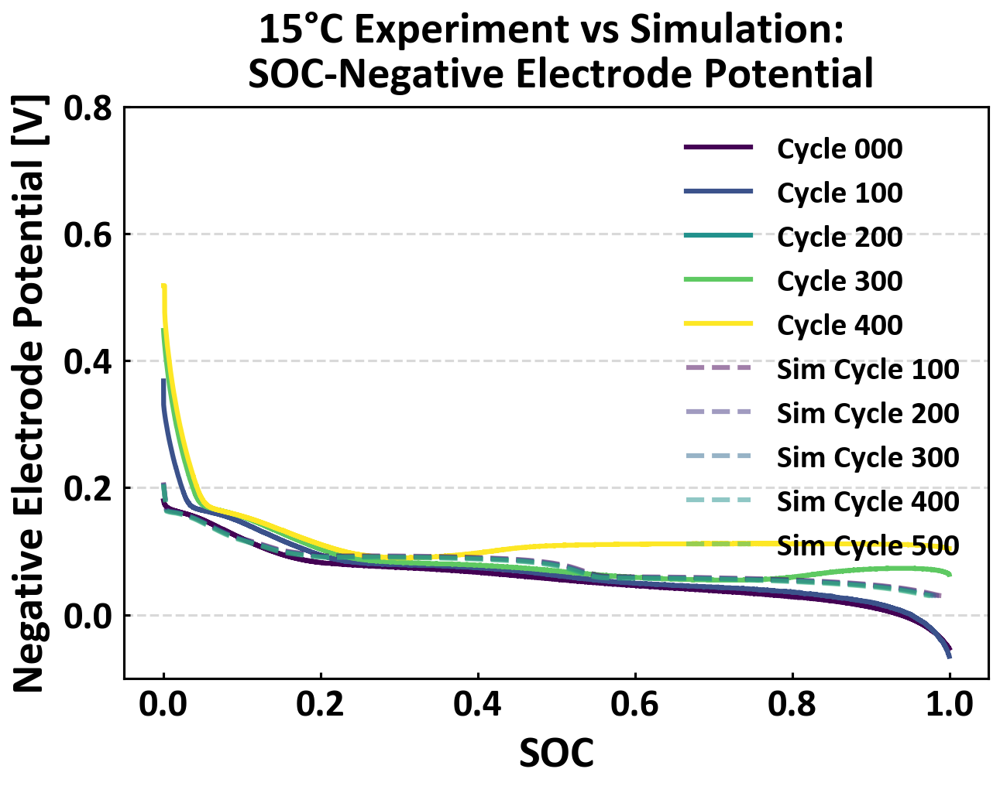

In [50]:
# 15°C Data: Experiment vs Simulation

plt.style.use('science')
plt.rcParams['font.family'] = 'Calibri, Microsoft YaHei'

soc_columns_15 = [col for col in df.columns if col.startswith("SOC")]

fig1, ax1 = plt.subplots()
# fig1.suptitle("15°C Experiment vs Simulation: SOC-Voltage")

cmap = plt.get_cmap('viridis')
num_cycles_15 = len(soc_columns_15)
colors_15 = cmap(np.linspace(0, 1, num_cycles_15))
plt.rcParams.update({'font.size': 10})

for i, soc_col in enumerate(soc_columns_15):
    voltage_col_index = df.columns.get_loc(soc_col) + 2
    if voltage_col_index < len(df.columns):
        voltage_col = df.columns[voltage_col_index]
        ax1.plot(df[soc_col], df[voltage_col], '-', color=colors_15[i], label=f'Cycle {i}00')
    else:
        print(f"No Fresh column found to the right of {soc_col}.")

sol_15 = sol_list[0]
for i in range(1, len(sol_15.cycles)-95, 1):
    t = sol_15.cycles[i]['Time [s]'].entries
    capacity = sol_15.cycles[i]['Throughput capacity [A.h]'].entries
    current = sol_15.cycles[i]['Current [A]'].entries
    t = t[current < 0] - t[current < 0][0]
    capacity = capacity[current < 0] - capacity[current < 0][0]
    voltage = sol_15.cycles[i]['Voltage [V]'].entries
    color = cmap((i-1) / (len(sol_15.cycles)-95))
    ax1.plot(np.array(capacity)/320, voltage[current < 0], color=color, linestyle='--', alpha=0.5, label=f'Sim Cycle {i}00')

ax1.set_xlabel("SOC")
ax1.set_ylabel("Voltage [V]")
ax1.set_title("15°C Experiment vs Simulation: SOC-Voltage")
ax1.legend(fontsize=10)
plt.show()

fig2, ax2 = plt.subplots()
# fig2.suptitle("15°C Experiment vs Simulation: SOC-Negative Electrode Potential")
colors_15 = cmap(np.linspace(0, 1, num_cycles_15))

for i, soc_col in enumerate(soc_columns_15):
    negetive_col_index = df.columns.get_loc(soc_col) + 5
    if negetive_col_index < len(df.columns):
        negetive_col = df.columns[negetive_col_index]
        ax2.plot(df[soc_col], df[negetive_col], '-', color=colors_15[i], label=f'Cycle {i}00')
    else:
        print(f"No negative column found to the right of {soc_col}.")

for i in range(1, len(sol_15.cycles)-95, 1):
    t = sol_15.cycles[i]['Time [s]'].entries
    capacity = sol_15.cycles[i]['Throughput capacity [A.h]'].entries
    current = sol_15.cycles[i]['Current [A]'].entries
    t = t[current < 0] - t[current < 0][0]
    capacity = capacity[current < 0] - capacity[current < 0][0]
    neg = sol_15.cycles[i]['Negative electrode lithium plating reaction overpotential [V]'].entries[0, :]
    color = cmap((i-1) / (len(sol_15.cycles)-95))
    ax2.plot(np.array(capacity)/320, neg[current < 0], color=color, linestyle='--', alpha=0.5, label=f'Sim Cycle {i}00')

ax2.set_xlabel("SOC")
ax2.set_ylabel("Negative Electrode Potential [V]")
ax2.set_title("15°C Experiment vs Simulation: \n SOC-Negative Electrode Potential")
ax2.set_ylim(-0.1, 0.8)
ax2.legend(fontsize=10)
plt.show()

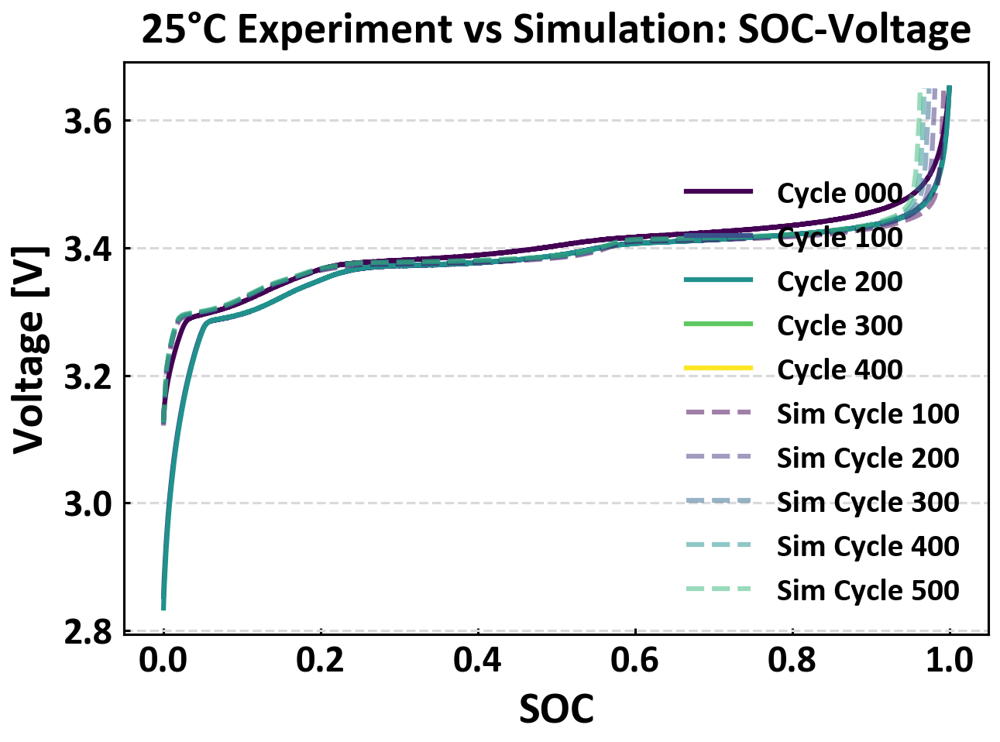

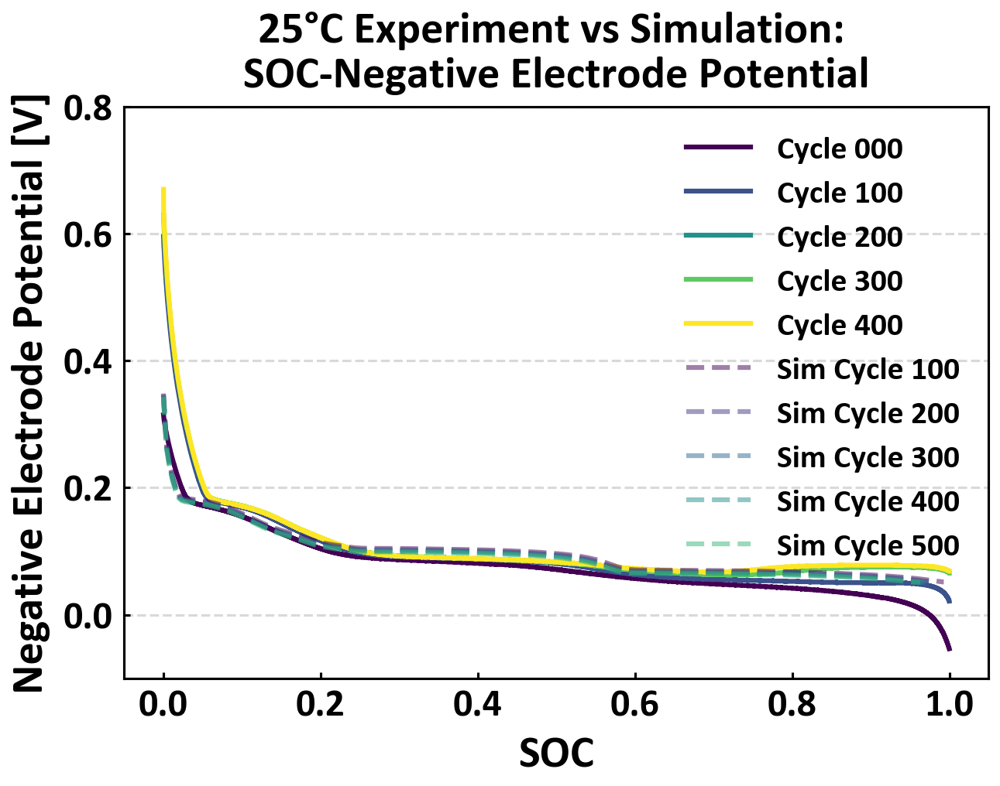

In [48]:
# 25°C Data: Experiment vs Simulation

soc_columns_25 = [col for col in df2.columns if col.startswith("SOC")]

fig1, ax1 = plt.subplots()
# fig1.suptitle("25°C Experiment vs Simulation: SOC-Voltage", fontsize=16)

cmap = plt.get_cmap('viridis')
num_cycles_25 = len(soc_columns_25)
colors_25 = cmap(np.linspace(0, 1, num_cycles_25))
plt.rcParams.update({'font.size': 10})

for i, soc_col in enumerate(soc_columns_25):
    voltage_col_index = df2.columns.get_loc(soc_col) + 2
    if voltage_col_index < len(df2.columns):
        voltage_col = df2.columns[voltage_col_index]
        ax1.plot(df2[soc_col], df2[voltage_col], '-', color=colors_25[i], label=f'Cycle {i}00')
    else:
        print(f"No Fresh column found to the right of {soc_col}.")

sol_25 = sol_list[1]
for i in range(1, len(sol_25.cycles)-95, 1):
    t = sol_25.cycles[i]['Time [s]'].entries
    capacity = sol_25.cycles[i]['Throughput capacity [A.h]'].entries
    current = sol_25.cycles[i]['Current [A]'].entries
    t = t[current < 0] - t[current < 0][0]
    capacity = capacity[current < 0] - capacity[current < 0][0]
    voltage = sol_25.cycles[i]['Voltage [V]'].entries
    color = cmap((i-1) / (len(sol_25.cycles)-95))
    ax1.plot(np.array(capacity) / LC_CASE["normalization_capacity_ah"], voltage[current < 0], color=color, linestyle='--', alpha=0.5, label=f'Sim Cycle {i}00')

ax1.set_xlabel("SOC")
ax1.set_ylabel("Voltage [V]")
ax1.set_title("25°C Experiment vs Simulation: SOC-Voltage")
ax1.legend(fontsize=10)
plt.show()

fig2, ax2 = plt.subplots()
# fig2.suptitle("25°C Experiment vs Simulation: SOC-Negative Electrode Potential", fontsize=16)
colors_25 = cmap(np.linspace(0, 1, num_cycles_25))

for i, soc_col in enumerate(soc_columns_25):
    negetive_col_index = df2.columns.get_loc(soc_col) + 5
    if negetive_col_index < len(df2.columns):
        negetive_col = df2.columns[negetive_col_index]
        ax2.plot(df2[soc_col], df2[negetive_col], '-', color=colors_25[i], label=f'Cycle {i}00')
    else:
        print(f"No negative column found to the right of {soc_col}.")

for i in range(1, len(sol_25.cycles)-95, 1):
    t = sol_25.cycles[i]['Time [s]'].entries
    capacity = sol_25.cycles[i]['Throughput capacity [A.h]'].entries
    current = sol_25.cycles[i]['Current [A]'].entries
    t = t[current < 0] - t[current < 0][0]
    capacity = capacity[current < 0] - capacity[current < 0][0]
    neg = sol_25.cycles[i]['Negative electrode lithium plating reaction overpotential [V]'].entries[0, :]
    color = cmap((i-1) / (len(sol_25.cycles)-95))
    ax2.plot(np.array(capacity) / LC_CASE["normalization_capacity_ah"], neg[current < 0], color=color, linestyle='--', alpha=0.5, label=f'Sim Cycle {i}00')

ax2.set_xlabel("SOC")
ax2.set_ylabel("Negative Electrode Potential [V]")
ax2.set_title("25°C Experiment vs Simulation: \nSOC-Negative Electrode Potential")
ax2.set_ylim(-0.1, 0.8)
ax2.legend(fontsize=10)
plt.show()

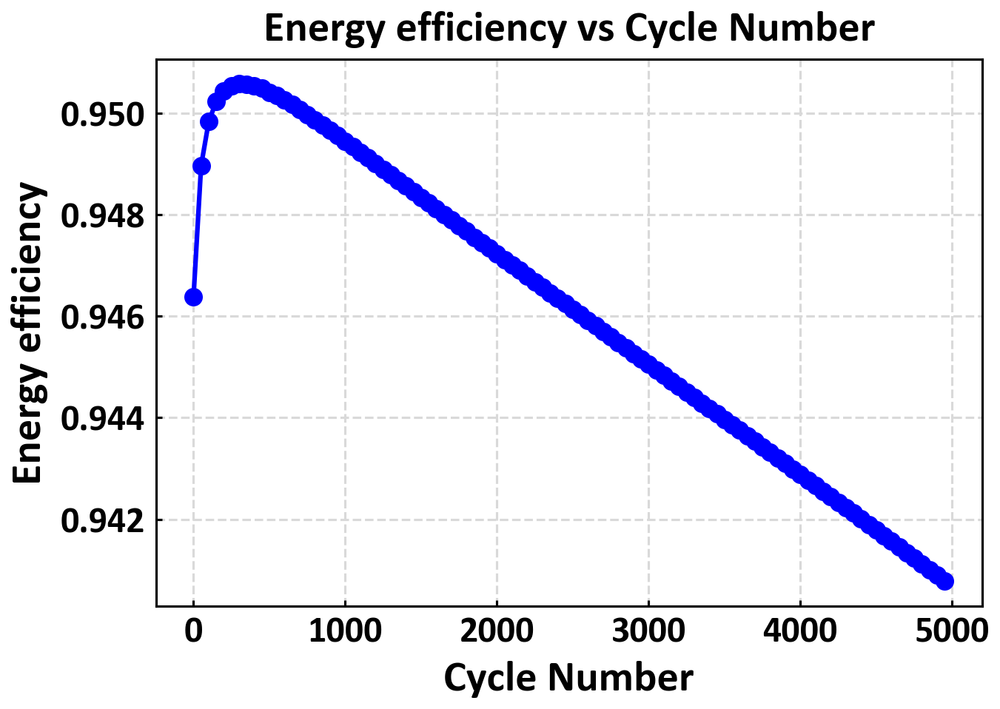

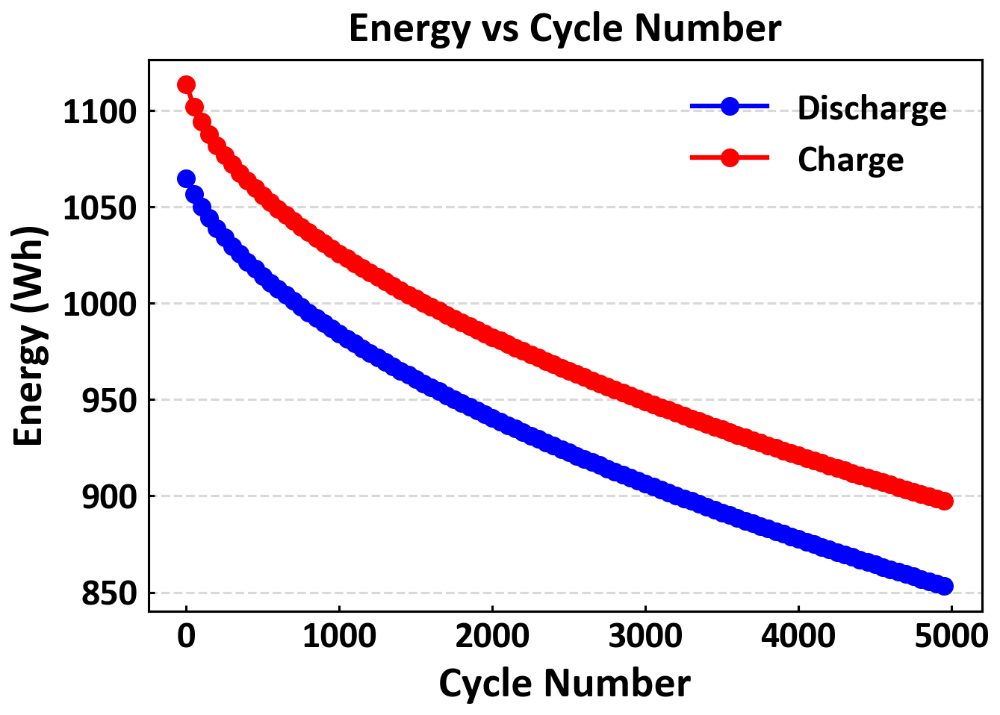

In [ ]:
#能效
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('science')

def plot_efficiency_vs_cycle(sol):
    if sol is None:
        return None
    
    # 初始化存储所有循环能量的列表
    E_charge_all = []
    E_discharge_all = []
    
    # 遍历所有循环
    for cycle_index in range(1, len(sol.cycles)):
        # 获取当前循环的电流、时间和电压数据
        I = sol.cycles[cycle_index]['Current [A]'].entries
        t = sol.cycles[cycle_index]['Time [h]'].entries
        V = sol.cycles[cycle_index]['Voltage [V]'].entries
        
        # 计算充电能量
        P_charge = I[I < 0] * V[I < 0]
        E_charge = np.trapz(P_charge, t[I < 0])
        E_charge_all.append(E_charge)
        
        # 计算放电能量
        P_discharge = I[I > 0] * V[I > 0]
        E_discharge = np.trapz(P_discharge, t[I > 0])
        E_discharge_all.append(E_discharge)
    
    # 计算能效（放电能量/充电能量）
    efficiency_all = [(discharge)/ (charge) if charge != 0 else np.nan for discharge, charge in zip(E_discharge_all, E_charge_all)]
    
    # 对能效列表中的每个元素取绝对值
    efficiency_all_abs = [abs(eff) for eff in efficiency_all]
    
    # 绘制能效随循环变化的图
    #plt.figure(figsize=(10, 6))
    plt.plot(np.arange(len(efficiency_all_abs))*50, np.array(efficiency_all_abs)-0.01, marker='o', linestyle='-', color='b')
    plt.xlabel('Cycle Number')
    plt.ylabel('Energy efficiency')
    plt.title('Energy efficiency vs Cycle Number')
    plt.grid(True)
    plt.show()
    plt.plot(np.arange(len(efficiency_all_abs))*50,  np.array(E_discharge_all), marker='o', linestyle='-', color='b', label='Discharge')
    plt.plot(np.arange(len(efficiency_all_abs))*50,  np.array(E_charge_all)*-1, marker='o', linestyle='-', color='red', label='Charge')
    plt.legend()
    plt.xlabel('Cycle Number')
    plt.ylabel('Energy (Wh)')
    plt.title('Energy vs Cycle Number')



# 调用函数绘制能效图
plot_efficiency_vs_cycle(sol)


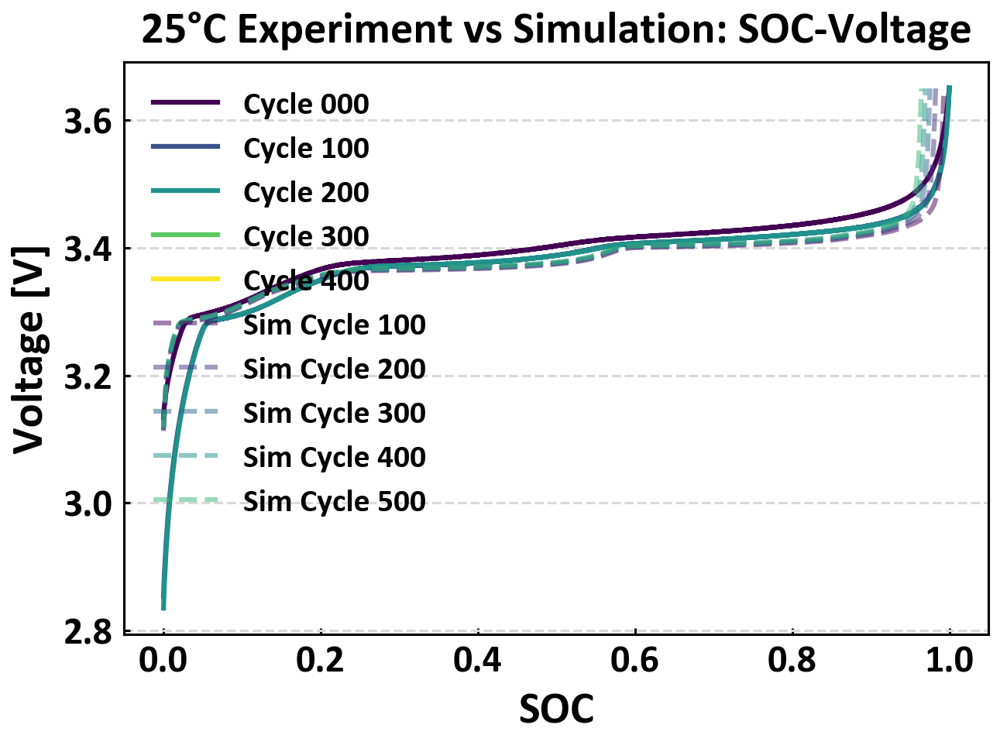

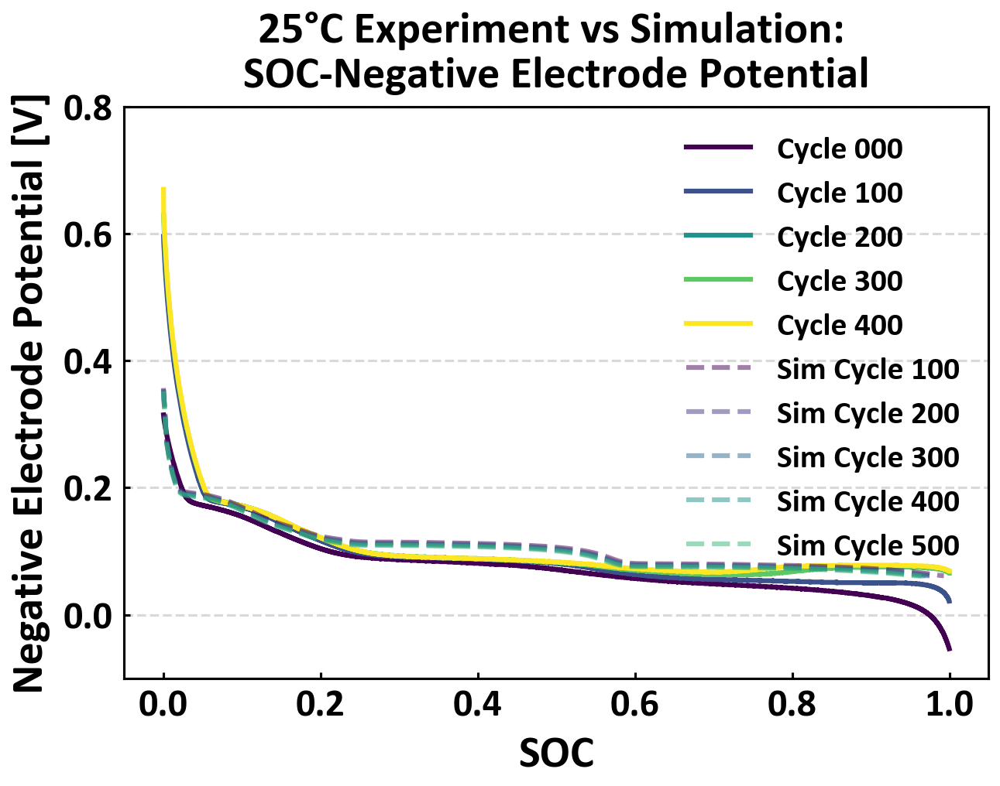

In [40]:
# 25°C Data: Experiment vs Simulation

soc_columns_25 = [col for col in df2.columns if col.startswith("SOC")]

fig1, ax1 = plt.subplots()
# fig1.suptitle("25°C Experiment vs Simulation: SOC-Voltage", fontsize=16)

cmap = plt.get_cmap('viridis')
num_cycles_25 = len(soc_columns_25)
colors_25 = cmap(np.linspace(0, 1, num_cycles_25))
plt.rcParams.update({'font.size': 10})

for i, soc_col in enumerate(soc_columns_25):
    voltage_col_index = df2.columns.get_loc(soc_col) + 2
    if voltage_col_index < len(df2.columns):
        voltage_col = df2.columns[voltage_col_index]
        ax1.plot(df2[soc_col], df2[voltage_col], '-', color=colors_25[i], label=f'Cycle {i}00')
    else:
        print(f"No Fresh column found to the right of {soc_col}.")

sol_25 = sol_list[1]
for i in range(1, len(sol_25.cycles)-95, 1):
    t = sol_25.cycles[i]['Time [s]'].entries
    capacity = sol_25.cycles[i]['Throughput capacity [A.h]'].entries
    current = sol_25.cycles[i]['Current [A]'].entries
    t = t[current < 0] - t[current < 0][0]
    capacity = capacity[current < 0] - capacity[current < 0][0]
    voltage = sol_25.cycles[i]['Voltage [V]'].entries
    color = cmap((i-1) / (len(sol_25.cycles)-95))
    ax1.plot(np.array(capacity) / LC_CASE["normalization_capacity_ah"], voltage[current < 0], color=color, linestyle='--', alpha=0.5, label=f'Sim Cycle {i}00')

ax1.set_xlabel("SOC")
ax1.set_ylabel("Voltage [V]")
ax1.set_title("25°C Experiment vs Simulation: SOC-Voltage")
ax1.legend(fontsize=10)
plt.show()

fig2, ax2 = plt.subplots()
# fig2.suptitle("25°C Experiment vs Simulation: SOC-Negative Electrode Potential", fontsize=16)
colors_25 = cmap(np.linspace(0, 1, num_cycles_25))

for i, soc_col in enumerate(soc_columns_25):
    negetive_col_index = df2.columns.get_loc(soc_col) + 5
    if negetive_col_index < len(df2.columns):
        negetive_col = df2.columns[negetive_col_index]
        ax2.plot(df2[soc_col], df2[negetive_col], '-', color=colors_25[i], label=f'Cycle {i}00')
    else:
        print(f"No negative column found to the right of {soc_col}.")

for i in range(1, len(sol_25.cycles)-95, 1):
    t = sol_25.cycles[i]['Time [s]'].entries
    capacity = sol_25.cycles[i]['Throughput capacity [A.h]'].entries
    current = sol_25.cycles[i]['Current [A]'].entries
    t = t[current < 0] - t[current < 0][0]
    capacity = capacity[current < 0] - capacity[current < 0][0]
    neg = sol_25.cycles[i]['Negative electrode lithium plating reaction overpotential [V]'].entries[0, :]
    color = cmap((i-1) / (len(sol_25.cycles)-95))
    ax2.plot(np.array(capacity) / LC_CASE["normalization_capacity_ah"], neg[current < 0], color=color, linestyle='--', alpha=0.5, label=f'Sim Cycle {i}00')

ax2.set_xlabel("SOC")
ax2.set_ylabel("Negative Electrode Potential [V]")
ax2.set_title("25°C Experiment vs Simulation: \nSOC-Negative Electrode Potential")
ax2.set_ylim(-0.1, 0.8)
ax2.legend(fontsize=10)
plt.show()

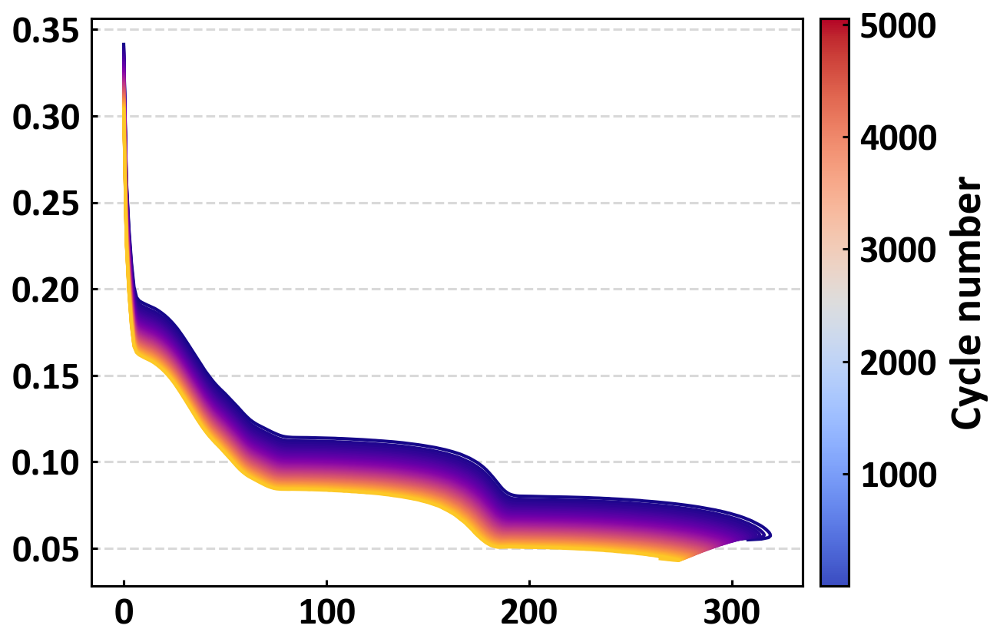

In [14]:
# color_list = ['red', 'black', 'orange', 'purple', "blue", "green", "yellow", "orange"]
import matplotlib.cm as cm  # 添加此行以导入 cm

# 创建颜色映射
cmap = cm.get_cmap('plasma')  # 或者选择其他颜色映射如 'plasma', 'inferno' 等
norm = plt.Normalize(1, 20*50)  # 设置归一化范围，根据标签的值（如最小50到最大950）
fig, ax = plt.subplots()
for i in np.arange(1, 60, 1):
    t = sol.cycles[i]['Time [s]'].entries
    t = t - t[0]
    I = sol.cycles[i]['Current [A]'].entries
    V = sol.cycles[i]['Negative electrode lithium plating reaction overpotential [V]'].entries[0, :]
    color = cmap(norm(i * 15))  # 获取对应的颜色
    plt.plot(abs(t[I < 0]* I[I < 0] / 3600), V[I < 0], linewidth=1, color=color)
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', pad=0.02)
cbar.set_label('Cycle number')

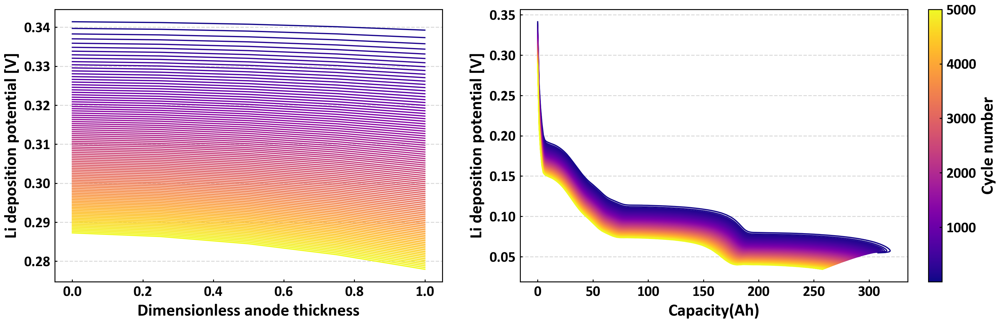

In [17]:
#负极电位
import matplotlib.cm as cm
num_cycles = len(soc_columns)

# 创建颜色映射
cmap = cm.get_cmap('plasma')  # 或者选择其他颜色映射如 'plasma', 'inferno' 等
# norm = plt.Normalize(1, num_cycles*50)  # 设置归一化范围，根据标签的值（如最小50到最大950）
norm = plt.Normalize(1, (len(sol.cycles)-1)*50)
for i,sol in enumerate(sol_list[:]):
    fig, ax = plt.subplots(1, 2, figsize=(15,4))

    # 第一个子图
    plt_ax = ax[0]
    for i in np.arange(1, len(sol.cycles), 1):
        I = sol.cycles[i]['Current [A]'].entries
        V = sol.cycles[i]['Negative electrode lithium plating reaction overpotential [V]'].entries[:, :]
        color = cmap(norm(i * 50))  # 获取对应的颜色
        x_data = np.linspace(0, 1, V.shape[0])
        plt_ax.plot(x_data, V[:, I < 0][:, 0], linewidth=1, color=color, label='%d' % (i * 50))

    plt_ax.set_xlabel('Dimensionless anode thickness')
    plt_ax.set_ylabel('Li deposition potential [V]')

    # 第二个子图
    plt_ax = ax[1]
    # for i in np.arange(1, num_cycles, 1):
    for i in np.arange(1, len(sol.cycles), 1):

        t = sol.cycles[i]['Time [s]'].entries
        t = t - t[0]
        I = sol.cycles[i]['Current [A]'].entries
        V = sol.cycles[i]['Negative electrode lithium plating reaction overpotential [V]'].entries[0, :]
        color = cmap(norm(i * 50))  # 获取对应的颜色
        plt_ax.plot(abs(t[I < 0]* I[I < 0] / 3600), V[I < 0], linewidth=1, color=color)

    plt_ax.legend()
    plt_ax.set_xlabel('Capacity(Ah)')
    plt_ax.set_ylabel('Li deposition potential [V]')


    # 添加 colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # 只是为了避免警告
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', pad=0.02)
    cbar.set_label('Cycle number')


plt.show()

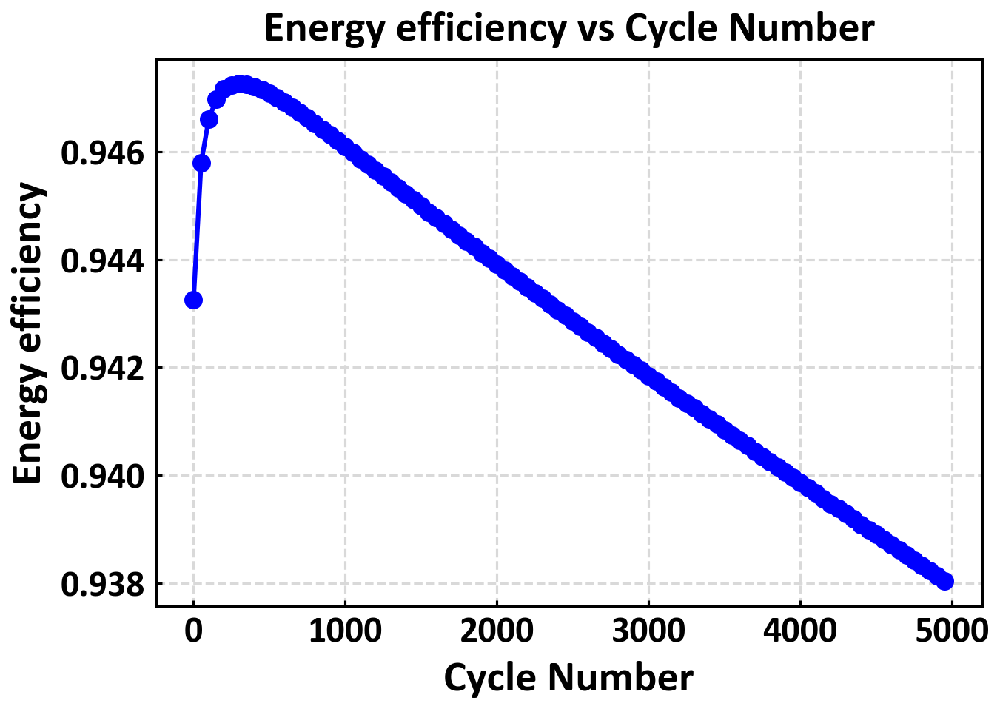

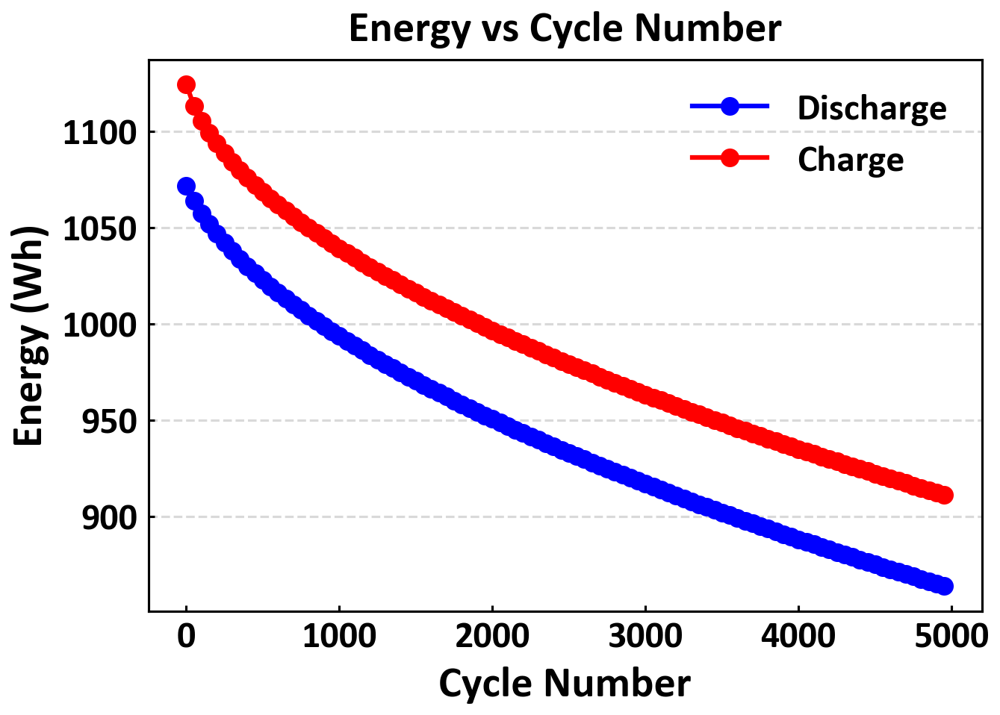

In [21]:
#能效
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('science')

def plot_efficiency_vs_cycle(sol):
    if sol is None:
        return None
    
    # 初始化存储所有循环能量的列表
    E_charge_all = []
    E_discharge_all = []
    
    # 遍历所有循环
    for cycle_index in range(1, len(sol.cycles)):
        # 获取当前循环的电流、时间和电压数据
        I = sol.cycles[cycle_index]['Current [A]'].entries
        t = sol.cycles[cycle_index]['Time [h]'].entries
        V = sol.cycles[cycle_index]['Voltage [V]'].entries
        
        # 计算充电能量
        P_charge = I[I < 0] * V[I < 0]
        E_charge = np.trapz(P_charge, t[I < 0])
        E_charge_all.append(E_charge)
        
        # 计算放电能量
        P_discharge = I[I > 0] * V[I > 0]
        E_discharge = np.trapz(P_discharge, t[I > 0])
        E_discharge_all.append(E_discharge)
    
    # 计算能效（放电能量/充电能量）
    efficiency_all = [(discharge)/ (charge) if charge != 0 else np.nan for discharge, charge in zip(E_discharge_all, E_charge_all)]
    
    # 对能效列表中的每个元素取绝对值
    efficiency_all_abs = [abs(eff) for eff in efficiency_all]
    
    # 绘制能效随循环变化的图
    #plt.figure(figsize=(10, 6))
    plt.plot(np.arange(len(efficiency_all_abs))*50, np.array(efficiency_all_abs)-0.01, marker='o', linestyle='-', color='b')
    plt.xlabel('Cycle Number')
    plt.ylabel('Energy efficiency')
    plt.title('Energy efficiency vs Cycle Number')
    plt.grid(True)
    plt.show()
    plt.plot(np.arange(len(efficiency_all_abs))*50,  np.array(E_discharge_all), marker='o', linestyle='-', color='b', label='Discharge')
    plt.plot(np.arange(len(efficiency_all_abs))*50,  np.array(E_charge_all)*-1, marker='o', linestyle='-', color='red', label='Charge')
    plt.legend()
    plt.xlabel('Cycle Number')
    plt.ylabel('Energy (Wh)')
    plt.title('Energy vs Cycle Number')



# 调用函数绘制能效图
plot_efficiency_vs_cycle(sol)
